# Term Frequencies, Sentiment Analysis and Topic Modeling

Prepared by: Albert 'Bash' Yumol

### Install relevant packages and libraries

In [1]:
!pip install gensim # topic modeling
!pip install pyLDAvis # visualizing topics
!pip install spacy # NLP
!pip install wordcloud
!pip install nltk # removing stopwords and cleaning texts
!pip install scikit-learn
!pip install scipy

!python -m spacy download en_core_web_sm # spacy dictionary

ERROR: Invalid requirement: '#'
ERROR: Invalid requirement: '#'
ERROR: Invalid requirement: '#'


ERROR: Invalid requirement: '#'


ERROR: Invalid requirement: '#'


### Importing the libraries

In [2]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
import gensim
import numpy as np
import spacy
import math
from scipy.sparse import csr_matrix
from sklearn.preprocessing import normalize

from gensim.models import CoherenceModel, LdaModel, LsiModel, HdpModel
from gensim.models.wrappers import LdaMallet
from gensim.corpora import Dictionary
import pyLDAvis.gensim

import nltk
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import text

import os, re, operator, warnings
warnings.filterwarnings('ignore')
%matplotlib inline

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Nico\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Nico\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Nico\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [3]:
def clean(text):
    '''
    This function takes in texts and converts it to unicode format so we can process it in Python.
    '''
    return str(''.join([i if ord(i) < 128 else ' ' for i in text]))


### For this workshop, we will be using the LEE BACKGROUND CORPUS. 
### It consists of 300 documents selected from the Australian Broadcasting Corporations' news mail service.
### This data set is available in gensim, so we load it with this code:
test_data_dir = '{}'.format(os.sep).join([gensim.__path__[0], 'test', 'test_data'])
lee_train_file = test_data_dir + os.sep + 'lee_background.cor'

In [5]:
# We then open the file:
text = open(lee_train_file).read()

# Use spacy model for our NLP Pipeline
nlp = spacy.load('en_core_web_lg')

# Load the stopwords (common words that are not important)
stop_words = stopwords.words('english')

In [6]:
# Removing the stopwords from our model vocabulary
for stopword in stop_words:
    lexeme = nlp.vocab[stopword]
    lexeme.is_stop = True

In [7]:
# We load the text, apply the clean function and use the spacy model to load the document
doc = nlp(clean(text))

In [8]:
# Here is what the document looks like. Each artcile is separated by a new line
doc

Hundreds of people have been forced to vacate their homes in the Southern Highlands of New South Wales as strong winds today pushed a huge bushfire towards the town of Hill Top. A new blaze near Goulburn, south-west of Sydney, has forced the closure of the Hume Highway. At about 4:00pm AEDT, a marked deterioration in the weather as a storm cell moved east across the Blue Mountains forced authorities to make a decision to evacuate people from homes in outlying streets at Hill Top in the New South Wales southern highlands. An estimated 500 residents have left their homes for nearby Mittagong. The New South Wales Rural Fire Service says the weather conditions which caused the fire to burn in a finger formation have now eased and about 60 fire units in and around Hill Top are optimistic of defending all properties. As more than 100 blazes burn on New Year's Eve in New South Wales, fire crews have been called to new fire at Gunning, south of Goulburn. While few details are available at this

In [10]:
# Using spacy, we lemmatize the text (getting the root words), remove the stopwords
# remove the punctuations and numbers
texts, article = [], []
for w in doc:
    if w.text != '\n' and not w.is_stop and not w.is_punct and not w.like_num:
        article.append(w.lemma_)
    if w.text == '\n':
        texts.append(article)
        article = []

In [11]:
# Here is what the texts looks like.
# Each element of the list contains a list of all texts in each article
texts

[['hundred',
  'people',
  'force',
  'vacate',
  'home',
  'Southern',
  'Highlands',
  'New',
  'South',
  'Wales',
  'strong',
  'wind',
  'today',
  'push',
  'huge',
  'bushfire',
  'town',
  'Hill',
  'new',
  'blaze',
  'near',
  'Goulburn',
  'south',
  'west',
  'Sydney',
  'force',
  'closure',
  'Hume',
  'Highway',
  '4:00pm',
  'AEDT',
  'marked',
  'deterioration',
  'weather',
  'storm',
  'cell',
  'move',
  'east',
  'Blue',
  'Mountains',
  'force',
  'authority',
  'decision',
  'evacuate',
  'people',
  'home',
  'outlying',
  'street',
  'Hill',
  'New',
  'South',
  'Wales',
  'southern',
  'highland',
  'estimated',
  'resident',
  'leave',
  'home',
  'nearby',
  'Mittagong',
  'New',
  'South',
  'Wales',
  'Rural',
  'Fire',
  'Service',
  'say',
  'weather',
  'condition',
  'cause',
  'fire',
  'burn',
  'finger',
  'formation',
  'ease',
  'fire',
  'unit',
  'Hill',
  'optimistic',
  'defend',
  'property',
  'blaze',
  'burn',
  'New',
  'Year',
  'Eve',


## Term Frequencies

We use term frequencies to identify important words in a document. Recall our discussion of the Zipf's law. It states that given a large sample of words, the frequency of any word is inversely proportional to its rank.

TF-IDF (Term Frequeny - Inverse Document Frequency) is one method to translate Zipf's law mathematically. Term frequency is just the weighted frequency of the word in each document, given by this equation:

$$
tf_{i,j} = \frac{n_{i,j}}{\sum_{k}n_{i,j}}
$$

On the other hand, Inverse Document Frequency is the weight of RARE words across all documents. Recall from discussion that rare words can be a factor of importance in a document. It can be represented mathematically as:

$$
idf(w) = log(\frac{N}{df_{t}})
$$

Combining these two equations gives us the important words in a document. Finally, we can write the TF-IDF score as:

$$
w_{i,j} = tf_{i,j} * log(\frac{N}{df_{t}})
$$

In [12]:
# To apply TF-IDF in our data set, firts we transform our text to be a list of all articles
transformed_texts = [' '.join(i) for i in texts]

In [13]:
# Then we make all the letters in lower case
transformed_texts_1 = [i.lower() for i in transformed_texts]

In [14]:
# We also remove all the digits with letters e.g. 4:30PM
transformed_texts_2 = [re.sub(r'\w*\d\w*', '', i).strip() for i in transformed_texts_1]

In [15]:
# These are the Python function implementation of the equations given above.

def IDF(corpus, unique_words):
    '''
    IDF equation
    '''
    idf_dict={}
    N=len(corpus)
    for i in unique_words:
        count=0
        for sen in corpus:
            if i in sen.split():
                count=count+1
            idf_dict[i]=(math.log((1+N)/(count+1)))+1
    return idf_dict

def fit(whole_data):
    '''
    Applying IDF to our data set.
    '''
    unique_words = set()
    if isinstance(whole_data, (list,)):
        for x in whole_data:
            for y in x.split():
                if len(y)<2:
                    continue
                unique_words.add(y)
        unique_words = sorted(list(unique_words))
        vocab = {j:i for i,j in enumerate(unique_words)}
        Idf_values_of_all_unique_words=IDF(whole_data,unique_words)
    return vocab, Idf_values_of_all_unique_words

def transform(dataset,vocabulary,idf_values):
    '''
    Calculating tf and multiplying it to IDF.
    '''
    vocab = {}
    sparse_matrix= csr_matrix( (len(dataset), len(vocabulary)), dtype=np.float64)
    for row  in range(0,len(dataset)):
        number_of_words_in_sentence=Counter(dataset[row].split())
        for word in dataset[row].split():
            if word in  list(vocabulary.keys()):
                tf_idf_value=(number_of_words_in_sentence[word]/len(dataset[row].split()))*(idf_values[word])
                sparse_matrix[row,vocabulary[word]]=tf_idf_value
                vocab[word] = tf_idf_value
    return vocab

In [16]:
# We call the fit function tp apply IDF to our data set.
Vocabulary, idf_of_vocabulary = fit(transformed_texts_2)

In [17]:
# Here are the IDF values for each word in the document
idf_of_vocabulary

{'aamer': 6.0106352940962555,
 'aarage': 6.0106352940962555,
 'abandon': 5.0943445622221,
 'abate': 5.605170185988092,
 'abbott': 6.0106352940962555,
 'abc': 5.605170185988092,
 'abdel': 5.605170185988092,
 'abdomen': 6.0106352940962555,
 'abdominal': 6.0106352940962555,
 'abduct': 6.0106352940962555,
 'abduction': 6.0106352940962555,
 'abdul': 5.0943445622221,
 'abdullah': 5.605170185988092,
 'abegglen': 5.31748811353631,
 'abide': 6.0106352940962555,
 'ability': 4.912023005428146,
 'able': 3.870569130599985,
 'abloy': 5.31748811353631,
 'ablution': 6.0106352940962555,
 'ably': 6.0106352940962555,
 'aboard': 4.7578723256008875,
 'aboriginal': 5.31748811353631,
 'abortion': 6.0106352940962555,
 'abroad': 5.605170185988092,
 'abruptly': 6.0106352940962555,
 'abscond': 5.605170185988092,
 'absolutely': 4.506557897319982,
 'abstain': 6.0106352940962555,
 'abu': 4.912023005428146,
 'abuse': 4.506557897319982,
 'abusive': 5.605170185988092,
 'aca': 6.0106352940962555,
 'academic': 6.0106352

In [18]:
# We can sort this list by using this code:
sorted_idf = dict(sorted(idf_of_vocabulary.items(), key=operator.itemgetter(1),reverse=True))

In [19]:
sorted_idf

{'aamer': 6.0106352940962555,
 'aarage': 6.0106352940962555,
 'abbott': 6.0106352940962555,
 'abdomen': 6.0106352940962555,
 'abdominal': 6.0106352940962555,
 'abduct': 6.0106352940962555,
 'abduction': 6.0106352940962555,
 'abide': 6.0106352940962555,
 'ablution': 6.0106352940962555,
 'ably': 6.0106352940962555,
 'abortion': 6.0106352940962555,
 'abruptly': 6.0106352940962555,
 'abstain': 6.0106352940962555,
 'aca': 6.0106352940962555,
 'academic': 6.0106352940962555,
 'accc': 6.0106352940962555,
 'accelerate': 6.0106352940962555,
 'acceptable': 6.0106352940962555,
 'accolade': 6.0106352940962555,
 'accommodation': 6.0106352940962555,
 'accountable': 6.0106352940962555,
 'accounting': 6.0106352940962555,
 'accrue': 6.0106352940962555,
 'accuracy': 6.0106352940962555,
 'accusation': 6.0106352940962555,
 'achievement': 6.0106352940962555,
 'acquisition': 6.0106352940962555,
 'activist': 6.0106352940962555,
 'actress': 6.0106352940962555,
 'adams': 6.0106352940962555,
 'adhere': 6.010635

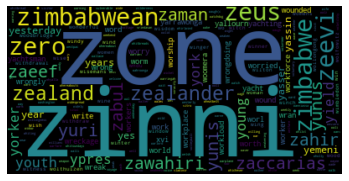

In [20]:
# We can also visualize the words in a word cloud. You will see that this 
# word cloud contains words starting with z as 'Vocalbulary' is just a list of all our words alphabetized
wordcloud = WordCloud().generate_from_frequencies(Vocabulary)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

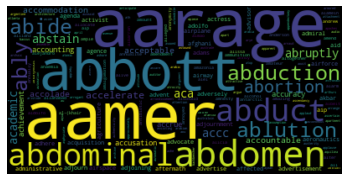

In [21]:
# same with IDF but now we reverse the order of the words so you will see words starting with letter a
wordcloud = WordCloud().generate_from_frequencies(idf_of_vocabulary)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [22]:
# To remove words that you don't want to include in the document, you can do this:
# E.g. removing the word 'aamer'
stop_words.extend(['aamer'])
stopwords_dict = Counter(stop_words)
transformed_texts_3 = [' '.join([word for word in i.split() if word not in stopwords_dict]) for i in transformed_texts_2]

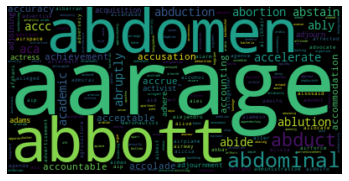

In [23]:
# Now in this word cloud you will see that 'aamer' is now gone
Vocabulary, idf_of_vocabulary = fit(transformed_texts_3)
wordcloud = WordCloud().generate_from_frequencies(idf_of_vocabulary)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [24]:
# Finally we call the transform function to produce the TF-IDF scores
final_output = transform(transformed_texts_3, Vocabulary, idf_of_vocabulary)

In [25]:
final_output

{'hundred': 0.01833370536903864,
 'people': 0.03608595756191217,
 'force': 0.08338665510199662,
 'vacate': 0.03780273769871859,
 'home': 0.03748861398505311,
 'southern': 0.06345195296065549,
 'highlands': 0.03780273769871859,
 'new': 0.037475219440501965,
 'south': 0.04025061037060397,
 'wales': 0.05414073922941059,
 'strong': 0.19352845652999928,
 'wind': 0.02638385068735852,
 'today': 0.044512627639838674,
 'push': 0.01849736373190546,
 'huge': 0.011606164964576362,
 'bushfire': 0.03127934184433124,
 'town': 0.01585158771135653,
 'hill': 0.3515729854056834,
 'blaze': 0.07434175508751387,
 'near': 0.05257827726540527,
 'goulburn': 0.07560547539743719,
 'west': 0.01293256013382952,
 'sydney': 0.03484313994238426,
 'closure': 0.03224268710267152,
 'hume': 0.15789211791515753,
 'highway': 0.0779686191337801,
 'aedt': 0.024486296054463508,
 'marked': 0.03780273769871859,
 'deterioration': 0.03780273769871859,
 'weather': 0.06340635084542612,
 'storm': 0.16226445480262314,
 'cell': 0.2311

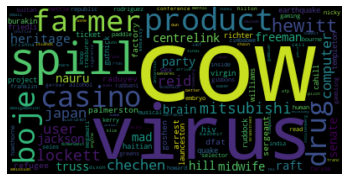

In [26]:
# As you can see from the word cloud, the TF-IDF produced sensible words. Now we know that the document is about
# virus, cow, drug, etc.
wordcloud = WordCloud().generate_from_frequencies(final_output)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Shortcut: TF-IDF implementation with sci-kit learn

In [27]:
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5,norm='l2',encoding='latin-1',ngram_range=(1,1), 
                        stop_words=stop_words)
features = tfidf.fit_transform(transformed_texts_3)

d = tfidf.vocabulary_

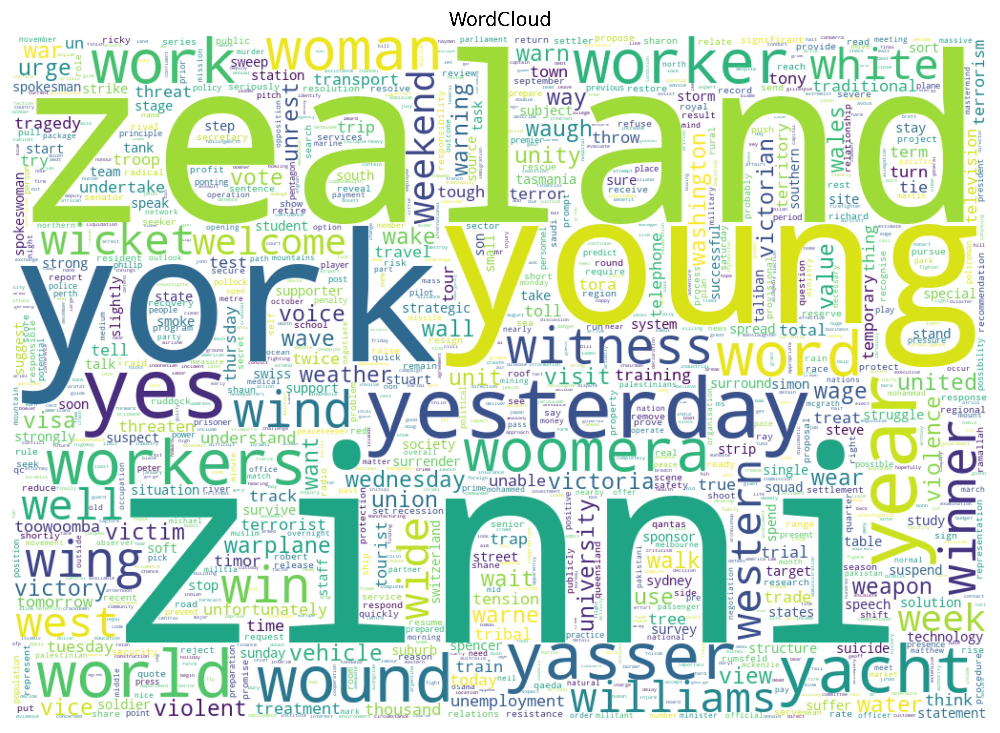

In [28]:
wordcloud = WordCloud(background_color='white', max_words=2000, width=1024, height= 720).generate_from_frequencies(d)
plt.figure(dpi=500, figsize=(20,8))
plt.title('WordCloud')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

## Sentiment Analysis

Sentiment analysis (also known as opinion mining) is an automated process (of Natural Language Processing) to classify a text (review, feedback, conversation etc.) by polarity (positive, negative, neutral) or emotion (happy, sad etc.).

For this workshop, we will use VADER. VADER (Valence Aware Dictionary and sEntiment Reasoner) is a lexicon and rule-based sentiment analysis tool that is specifically designed to extract sentiments expressed in social media. It is fully open-sourced under the MIT License.

Lexicon is a list of words. For example positive lexicon is a list of all possible positive words (like good, amaze, appreciable etc.). Similarly negative lexicon is a list of all possible negative words (like bad, abolish, ambush etc.)

Rule based approach of sentiment analysis takes each words of your product review text pass though those two dictionaries or lexicons (positive and negative word list) and count the number of positive and negative words in your review text. Based on that number you can determine whether your review is positive or negative.

In [29]:
# We call the the VADER model and appy it directly to our articles and voila!
# It gives us negative, positive and neutral score.
# The weighted sum of these three is the compound value which tells us the overall sentiment of the doc.
sid = SentimentIntensityAnalyzer()
for i in range(len(transformed_texts_3)):
    print(transformed_texts_3[i] + ': ')
    scores = sid.polarity_scores(transformed_texts_3[i])
    print(scores)

hundred people force vacate home southern highlands new south wales strong wind today push huge bushfire town hill new blaze near goulburn south west sydney force closure hume highway : aedt marked deterioration weather storm cell move east blue mountains force authority decision evacuate people home outlying street hill new south wales southern highland estimated resident leave home nearby mittagong new south wales rural fire service say weather condition cause fire burn finger formation ease fire unit hill optimistic defend property blaze burn new year eve new south wales fire crew call new fire gunning south goulburn detail available stage fire authority say close hume highway direction new fire sydney west long threaten property cranebrook area rain fall part illawarra sydney hunter valley north coast bureau meteorology claire richards say rain little ease fire burn state fall isolate area generally fall millimetre say place significant millimetre relief far rain concern fact proba

{'neg': 0.119, 'neu': 0.716, 'pos': 0.165, 'compound': 0.7003}
australian cricket captain steve waugh support fast bowler brett lee criticism intimidatory bowling south african tailender test adelaide early month lee fine give new zealand tailender shane bond unsportsmanlike send test perth waugh say tailender protect short pitch bowling day earn big money get responsibility learn bat say mean time like year ago professional sort bowler code day professional batsman work hard batting expect tailender likewise waugh say need guard complacency convincingly win test run waugh say despite dominance test south africa take lightly test match whichever way want look lot work say nice win battle definitely give lot confidence go melbourne know big crowd love play boxing day crowd advantage south africa begin day match new south wales sydney thursday lead boxing day test veteran fast bowler allan donald play warm match likely place team test south african captain shaun pollock expect well perfo

{'neg': 0.316, 'neu': 0.684, 'pos': 0.0, 'compound': -0.9803}
royal commission collapse insurance giant hih tell director include chairman ray williams bid huge termination payout shortly provisional liquidation chief liquidator anthony mcgrath tell commission resolution pass board meeting december year pay mr williams termination payout worth time annual salary $ mr mcgrath say payout understanding pay statutory entitlement annual leave long service leave severance payment stage say mr mcgrath go outline request fellow director george sturesteps ask twice annual pay meeting march hour company place provisional liquidation director chief financial officer dominic fodera ask twice annual salary termination payment mr mcgrath say view request inappropriate company director concern provisional liquidation imminent time: 
{'neg': 0.091, 'neu': 0.87, 'pos': 0.039, 'compound': -0.3818}
union represent qantas maintenance worker rule disruption christmas flight follow breakdown negotiation man

{'neg': 0.298, 'neu': 0.613, 'pos': 0.089, 'compound': -0.936}
israeli prime minister ariel sharon open emergency security cabinet meeting place blame recent suicide attack squarely palestinian leader yasser arafat call urgent meeting head security system shortly government hold special session government meet order decision deal terrorism say national address public television government discuss policy palestinian authority mr sharon imply enemy jewish state bear consequence rise kill responsible destruction say statement interpret palestinian official war arafat strategic choice strategy terrorism choose try win political accomplishment murder choose allow ruthless killing civilian arafat choose path terrorism mr sharon say government represent practically israel public paramount goal need unity order cope brutality face add tonight hear declaration war say chief palestinian negotiator saeb erakat cnn television sharon choose path darkness address israeli helicopter warplane attack t

## Topic Modeling

Refer to the slides. We will be using gensim for topic modeling through three models:

- Latent Semantic Indexing (LSI)
- Latent Dirichlet Allocation (LDA)
- Hierarchical Dirichlet Process (HDP)

LSI is just an implemetation of Singular Value Decomposition with texts like PCA. Basically you are reducing the dimension of the text by finding latent (hidden) patterns.

HDP is an extension of LDA, designed to address the case where the number of mixture components (the number of "topics" in document-modeling terms) is not known a priori. So that's the reason why there's a difference.

Using LDA for document modeling, one treats each "topic" as a distribution of words in some known vocabulary. For each document a mixture of topics is drawn from a Dirichlet distribution, and then each word in the document is an independent draw from that mixture (that is, selecting a topic and then using it to generate a word).

For HDP (applied to document modeling), one also uses a Dirichlet process to capture the uncertainty in the number of topics. So a common base distribution is selected which represents the countably-infinite set of possible topics for the corpus, and then the finite distribution of topics for each document is sampled from this base distribution.

As far as pros and cons, HDP has the advantage that the maximum number of topics can be unbounded and learned from the data rather than specified in advance. I suppose though it is more complicated to implement, and unnecessary in the case where a bounded number of topics is acceptable.


In [30]:
# Recall that our text document looks like this:
# We need to transform this further to include bigrams (two words)
# E.g. New South are separate words but it should be one

texts

[['hundred',
  'people',
  'force',
  'vacate',
  'home',
  'Southern',
  'Highlands',
  'New',
  'South',
  'Wales',
  'strong',
  'wind',
  'today',
  'push',
  'huge',
  'bushfire',
  'town',
  'Hill',
  'new',
  'blaze',
  'near',
  'Goulburn',
  'south',
  'west',
  'Sydney',
  'force',
  'closure',
  'Hume',
  'Highway',
  '4:00pm',
  'AEDT',
  'marked',
  'deterioration',
  'weather',
  'storm',
  'cell',
  'move',
  'east',
  'Blue',
  'Mountains',
  'force',
  'authority',
  'decision',
  'evacuate',
  'people',
  'home',
  'outlying',
  'street',
  'Hill',
  'New',
  'South',
  'Wales',
  'southern',
  'highland',
  'estimated',
  'resident',
  'leave',
  'home',
  'nearby',
  'Mittagong',
  'New',
  'South',
  'Wales',
  'Rural',
  'Fire',
  'Service',
  'say',
  'weather',
  'condition',
  'cause',
  'fire',
  'burn',
  'finger',
  'formation',
  'ease',
  'fire',
  'unit',
  'Hill',
  'optimistic',
  'defend',
  'property',
  'blaze',
  'burn',
  'New',
  'Year',
  'Eve',


In [31]:
# We use gensim for the bigram
bigram = gensim.models.Phrases(texts)
texts = [bigram[line] for line in texts]

In [32]:
# Now notice that New South is now one words
texts

[['hundred',
  'people',
  'force',
  'vacate',
  'home',
  'Southern',
  'Highlands',
  'New_South',
  'Wales',
  'strong',
  'wind',
  'today',
  'push',
  'huge',
  'bushfire',
  'town',
  'Hill',
  'new',
  'blaze',
  'near',
  'Goulburn',
  'south_west',
  'Sydney',
  'force',
  'closure',
  'Hume',
  'Highway',
  '4:00pm',
  'AEDT',
  'marked',
  'deterioration',
  'weather',
  'storm',
  'cell',
  'move',
  'east',
  'Blue_Mountains',
  'force',
  'authority',
  'decision',
  'evacuate',
  'people',
  'home',
  'outlying',
  'street',
  'Hill',
  'New_South',
  'Wales',
  'southern',
  'highland',
  'estimated',
  'resident',
  'leave',
  'home',
  'nearby',
  'Mittagong',
  'New_South',
  'Wales',
  'Rural_Fire',
  'Service',
  'say',
  'weather_condition',
  'cause',
  'fire_burn',
  'finger',
  'formation',
  'ease',
  'fire',
  'unit',
  'Hill',
  'optimistic',
  'defend',
  'property',
  'blaze',
  'burn',
  'New',
  'Year',
  'Eve',
  'New_South',
  'Wales',
  'fire',
  'c

In [33]:
# Next we need to format out text so iy can be read by gensim, we define a dictionary and a corpus
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

In [34]:
corpus

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 2),
  (8, 1),
  (9, 2),
  (10, 3),
  (11, 2),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 4),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 3),
  (23, 1),
  (24, 4),
  (25, 1),
  (26, 2),
  (27, 1),
  (28, 2),
  (29, 1),
  (30, 2),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 2),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 3),
  (53, 1),
  (54, 1),
  (55, 5),
  (56, 2),
  (57, 1),
  (58, 3),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 3),
  (66, 1),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 2),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 3),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 2),
  (83, 1),
  (84, 1),
  (85, 2),
  (86, 1),
  (87, 3),
  (88, 1),
  (89, 1),
  (90, 4),
  (91, 1)

In [35]:
# Here is how you use the lsimodel

lsimodel = LsiModel(corpus=corpus, num_topics=10, id2word=dictionary)
lsimodel.show_topics(num_topics=5)

[(0,
  '-0.788*"say" + -0.142*"Mr" + -0.095*"force" + -0.094*"israeli" + -0.094*"people" + -0.083*"Australia" + -0.082*"kill" + -0.080*"attack" + -0.079*"palestinian" + -0.079*"official"'),
 (1,
  '-0.387*"israeli" + -0.345*"palestinian" + -0.286*"Mr_Arafat" + -0.192*"Israel" + -0.177*"official" + 0.164*"say" + -0.164*"Hamas" + -0.155*"kill" + -0.151*"West_Bank" + -0.136*"attack"'),
 (2,
  '-0.314*"Afghanistan" + -0.294*"force" + -0.218*"Al_Qaeda" + -0.194*"bin_Laden" + -0.159*"fighter" + -0.153*"Taliban" + -0.153*"Tora_Bora" + -0.150*"Pakistan" + -0.141*"afghan" + 0.116*"fire"'),
 (3,
  '0.403*"fire" + 0.290*"area" + 0.244*"Sydney" + 0.193*"firefighter" + 0.177*"north" + 0.167*"wind" + 0.167*"New_South" + 0.167*"Wales" + 0.141*"south" + 0.128*"line"'),
 (4,
  '-0.240*"Australia" + -0.234*"test" + 0.226*"Mr" + -0.223*"day" + -0.195*"match" + -0.186*"wicket" + -0.186*"South_Africa" + -0.168*"good" + -0.155*"play" + -0.147*"run"')]

In [36]:
# Here is how you use the hdpmodel
# Recall from discussion that HDP is unsupervised so you don't need to predefine the number of topics

hdpmodel = HdpModel(corpus=corpus, id2word=dictionary)
hdpmodel.show_topics()

[(0,
  '0.006*say + 0.004*storm + 0.002*tree + 0.002*Sydney + 0.002*Mr + 0.002*work + 0.002*SES + 0.002*damage + 0.002*bring + 0.002*need + 0.002*area + 0.002*commission + 0.002*bad + 0.002*low + 0.001*Hornsby + 0.001*today + 0.001*hit + 0.001*collapse + 0.001*ASIC + 0.001*Emergency'),
 (1,
  '0.006*say + 0.003*group + 0.003*palestinian + 0.003*Government + 0.002*kill + 0.002*head + 0.002*weekend + 0.002*choose + 0.002*include + 0.002*year + 0.002*attack + 0.002*suicide_attack + 0.002*terrorism + 0.002*inappropriate + 0.002*human_right + 0.002*call + 0.001*militant + 0.001*israeli + 0.001*Mr + 0.001*Sharon'),
 (2,
  '0.008*say + 0.003*airport + 0.003*Taliban + 0.002*kill + 0.002*opposition + 0.002*Kandahar + 0.002*night + 0.002*half + 0.002*appear + 0.002*report + 0.002*city + 0.002*Lali + 0.002*state + 0.002*civilian + 0.001*man + 0.001*bombing + 0.001*amalgamation + 0.001*confidence + 0.001*leave + 0.001*Gorge'),
 (3,
  '0.004*say + 0.003*Benares + 0.003*Krishna + 0.002*guide + 0.002

In [37]:
# Here is how you use the ldamodel

ldamodel = LdaModel(corpus=corpus, num_topics=10, id2word=dictionary)
ldamodel.show_topics()

[(0,
  '0.039*"say" + 0.005*"Mr" + 0.004*"people" + 0.004*"arrest" + 0.004*"official" + 0.003*"palestinian" + 0.003*"day" + 0.003*"israeli" + 0.003*"attack" + 0.003*"fire"'),
 (1,
  '0.027*"say" + 0.005*"Mr" + 0.005*"people" + 0.005*"Australia" + 0.004*"force" + 0.004*"day" + 0.004*"fire" + 0.003*"man" + 0.003*"report" + 0.003*"attack"'),
 (2,
  '0.029*"say" + 0.006*"Mr" + 0.004*"year" + 0.004*"United_States" + 0.004*"Australia" + 0.004*"report" + 0.003*"come" + 0.003*"tell" + 0.003*"people" + 0.003*"Australian"'),
 (3,
  '0.013*"say" + 0.006*"force" + 0.005*"Al_Qaeda" + 0.005*"kill" + 0.004*"area" + 0.004*"good" + 0.004*"hour" + 0.004*"israeli" + 0.004*"fighter" + 0.004*"Afghanistan"'),
 (4,
  '0.034*"say" + 0.007*"Mr" + 0.005*"Australia" + 0.004*"people" + 0.003*"year" + 0.003*"tell" + 0.003*"company" + 0.003*"staff" + 0.003*"fire" + 0.003*"today"'),
 (5,
  '0.022*"say" + 0.006*"people" + 0.006*"Mr" + 0.005*"day" + 0.005*"Australia" + 0.004*"give" + 0.003*"attack" + 0.003*"israeli" +

In [38]:
# Here is a visualization of the LDA topics
pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(ldamodel,corpus,dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9     -0.011768  0.013642       1        1  13.675421
5      0.001287 -0.046779       2        1  11.920214
4     -0.022573 -0.001986       3        1  11.663282
0      0.014987 -0.026339       4        1  11.498907
2     -0.005917 -0.007347       5        1  11.418186
8      0.014664 -0.035504       6        1  10.595445
1      0.006012 -0.005973       7        1   8.986335
7     -0.070614  0.041298       8        1   8.433795
6     -0.000520  0.015149       9        1   6.262228
3      0.074441  0.053839      10        1   5.546187, topic_info=          Term        Freq       Total Category  logprob  loglift
2372    Qantas   26.000000   26.000000  Default  30.0000  30.0000
2346   company   58.000000   58.000000  Default  29.0000  29.0000
90         say  776.000000  776.000000  Default  28.0000  28.0000
1463  Al_Qaeda   43.000000   43.000000  Default  27.0000  27.0000
1009    worker   26.000000   26.000000  Default  26.0000  26.0000
...        ...         ...         ...      ...      ...      ...
83       place    3.752241   42.241689  Topic10  -6.0876   0.4710
675   official    3.953623   72.439102  Topic10  -6.0353  -0.0161
82      people    4.098893  110.823597  Topic10  -5.9992  -0.4052
1709   confirm    3.350020   26.812564  Topic10  -6.2010   0.8122
265       tell    3.555723   69.972836  Topic10  -6.1414  -0.0875

[771 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
362       1  0.031833          $
362       2  0.127333          $
362       3  0.063666          $
362       4  0.095500          $
362       5  0.095500          $
...     ...       ...        ...
178       6  0.096830  yesterday
178       7  0.096830  yesterday
178       8  0.096830  yesterday
178       9  0.096830  yesterday
178      10  0.024208  yesterday

[2268 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 6, 5, 1, 3, 9, 2, 8, 7, 4])

In [39]:
# Next we extract each words to measure and compare model performance
lsitopics = [[word for word, prob in topic] for topicid, topic in lsimodel.show_topics(formatted=False)]
hdptopics = [[word for word, prob in topic] for topicid, topic in hdpmodel.show_topics(formatted=False)]
ldatopics = [[word for word, prob in topic] for topicid, topic in ldamodel.show_topics(formatted=False)]

In [40]:
# Then we get the coherence scores. Higher coherence, better results.
lsi_coherence = CoherenceModel(topics=lsitopics[:10],texts=texts,dictionary=dictionary,window_size=10).get_coherence()
hdp_coherence = CoherenceModel(topics=hdptopics[:10],texts=texts,dictionary=dictionary,window_size=10).get_coherence()
lda_coherence = CoherenceModel(topics=ldatopics[:10],texts=texts,dictionary=dictionary,window_size=10).get_coherence()

In [41]:
# Then we compare a bar chart to compare the three models
def evaluate_bar_graph(coherences, indices):
    assert len(coherences) == len(indices)
    n = len(coherences)
    x = np.arange(n)
    plt.bar(x, coherences, width=0.2,tick_label=indices, align='center')
    plt.xlabel('Models')
    plt.ylabel('Coherence Value')

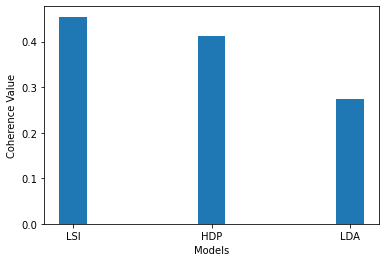

In [42]:
# LSI wins
evaluate_bar_graph([lsi_coherence, hdp_coherence, lda_coherence], ['LSI', 'HDP', 'LDA'])

In [43]:
lsi_coherence

0.45452309335272706